In [6]:
import torch
import pandas as pd
import numpy as np
from numpy import random
import torch.nn as nn
from torch.amp import autocast
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from tabulate import tabulate

from utils import *
from evaluate import evaluate, save_predictions
from metrics import calculate_dtw_distances, calculate_dtw_for_index, plot_dtw_alignment_for_index, calculate_wasserstein_distance

In [3]:
device_name = 'cuda:1'
name = "stgF_ddim_e30_bs16_do10_cgt10_cg2_norm_without_transform"
cfg_scale = 2
noise_steps = 1000
section_counts = 40

#-------------------------------------------------------------
test_data_path = "../data/val_data_stg7_norm.csv"
#test_data_path = "../data/for_testing.csv"
predictions_path = "results/predictions/preds_" + name + ".csv"
model_path = "models/" + name + "/ema_ckpt10.pt"
scale_predictor_path = "models/" + name + "/scale_predictor10.pt"

# Make predictions on test data

In [4]:
x_real, cond_vectors, predictions = evaluate(device=device_name,
                                             test_csv_path=test_data_path,
                                             model_path=model_path,
                                             scale_predictor_path=scale_predictor_path,
                                             n_samples=1,
                                             s_type='ddim',
                                             cfg_scale=cfg_scale,
                                             noise_steps=noise_steps,
                                            section_counts=section_counts)

Testing loop: 100%|█████████████████████████████████████| 2045/2045 [55:51<00:00,  1.64s/it]


In [5]:
mse_error = np.mean((x_real - predictions) ** 2)
print(f"MSE error: {mse_error:.6f}")

MSE error: 0.002446


# Save predictions

In [7]:
df = save_predictions(x_real, cond_vectors, predictions, predictions_path)

Predictions saved to results/predictions/preds_stgF_ddim_e30_bs16_do10_cgt10_cg2_norm_without_transform.csv


In [8]:
df.head()

,x_real,cond_vectors,predictions
0,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.9878669,-0.98648405,-0.9773309,-0.98485464,..."
1,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.99447393,-0.99575204,-0.9967019,-0.9994229,..."
2,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.9919316,-0.9893059,-0.9899978,-0.99404186,-..."
3,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.9960444,-0.9950224,-0.9961753,-0.9939819,-0..."
4,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.99517006,-0.99544406,-0.9939555,-0.9954613,..."


In [9]:
# Function to convert comma-separated strings to lists of floats
def str_to_float_list(s):
    return np.array(list(map(float, s.split(','))))

x_real = np.array([str_to_float_list(row) for row in df['x_real']])
cond_vectors = np.array([str_to_float_list(row) for row in df['cond_vectors']])
predictions = np.array([str_to_float_list(row) for row in df['predictions']])

df.head()

,x_real,cond_vectors,predictions
0,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.9878669,-0.98648405,-0.9773309,-0.98485464,..."
1,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.99447393,-0.99575204,-0.9967019,-0.9994229,..."
2,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.9919316,-0.9893059,-0.9899978,-0.99404186,-..."
3,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.9960444,-0.9950224,-0.9961753,-0.9939819,-0..."
4,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.3478,-0.4151,-0.8214,-1.6029,-2.0,-1.0,-1.4...","-0.99517006,-0.99544406,-0.9939555,-0.9954613,..."


# Intro into data

In [10]:
# Find indices and values greater than 0.5
indices = np.where(np.any(x_real > 0.5, axis=1))[0]
filtered_values = [x_real[idx][x_real[idx] > 0.5] for idx in indices]
filtered_predictions = [predictions[idx][x_real[idx] > 0.5] for idx in indices]

# Flatten results and take the first 50
flat_filtered_values = np.concatenate(filtered_values)[:50]
flat_filtered_predictions = np.concatenate(filtered_predictions)[:50]

# Print the results side by side
print("Filtered Values (greater than 0.5) from x_real and corresponding Predictions:")
for value, prediction in zip(flat_filtered_values, flat_filtered_predictions):
    print(f"{value:.5f}\t\t\t{prediction:.5f}")

Filtered Values (greater than 0.5) from x_real and corresponding Predictions:
0.50698			0.47290
0.50698			0.47542
0.60785			0.33207
0.67365			0.41037
0.71205			0.45599
0.67921			0.44742
0.59647			0.39025
0.56111			0.39226
0.61201			0.42236
0.59793			0.39508
0.52645			0.32644
0.50782			0.35079
0.58487			0.43066
0.64452			0.46343
0.63170			0.44797
0.55646			0.38142
0.51323			0.41851
0.50540			0.39960
0.53860			0.39430
0.58075			0.41986
0.57043			0.38670
0.55325			0.39592
0.53291			0.36877
0.54324			0.40242
0.51541			0.37961
0.54408			0.28772
0.61363			0.36979
0.66453			0.41126
0.63295			0.39815
0.53020			0.34773


In [11]:
# Find indices where predictions > 0.8 and corresponding x_real < 0.5
indices = np.where((predictions > 0.8) & (x_real < 0.1))

# Extract filtered values from x_real and predictions
filtered_x_real = x_real[indices]
filtered_predictions = predictions[indices]

# Print the results side by side
print("Filtered x_real (values < 0.1) and corresponding Predictions (values > 0.8):")
for x_val, pred_val in zip(filtered_x_real.flatten(), filtered_predictions.flatten()):
    print(f"{x_val:.5f}\t\t\t{pred_val:.5f}")

Filtered x_real (values < 0.1) and corresponding Predictions (values > 0.8):


# Visualization of results

In [12]:
wavelengths = np.load('../data/wavelengths.npy')

In [13]:
wavelengths

array([ 634.835144,  635.296997,  635.758911, ..., 1123.063232,
       1123.557739, 1124.052368])

## Plot predictions

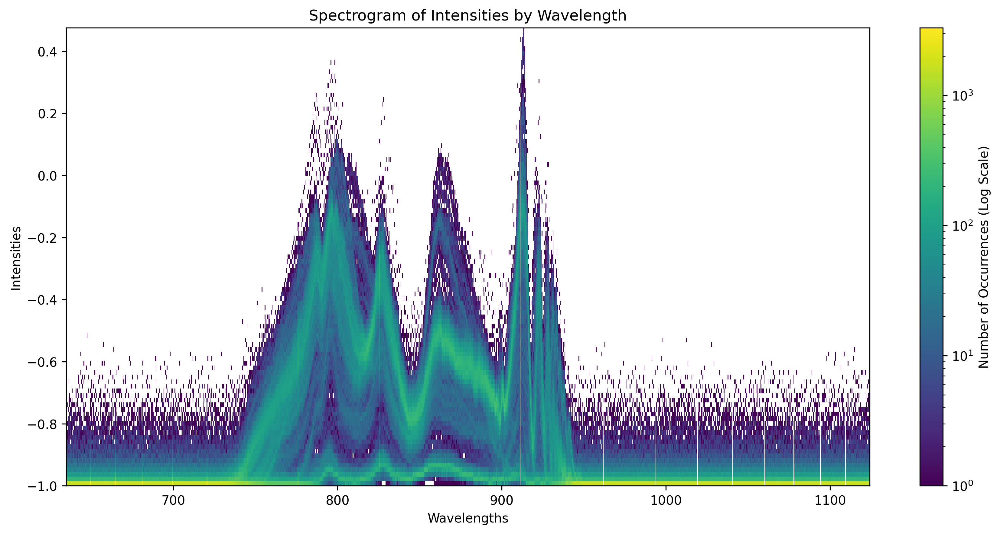

In [14]:
create_spectrogram(wavelengths, predictions, label="Spectrogram of Intensities by Wavelength")

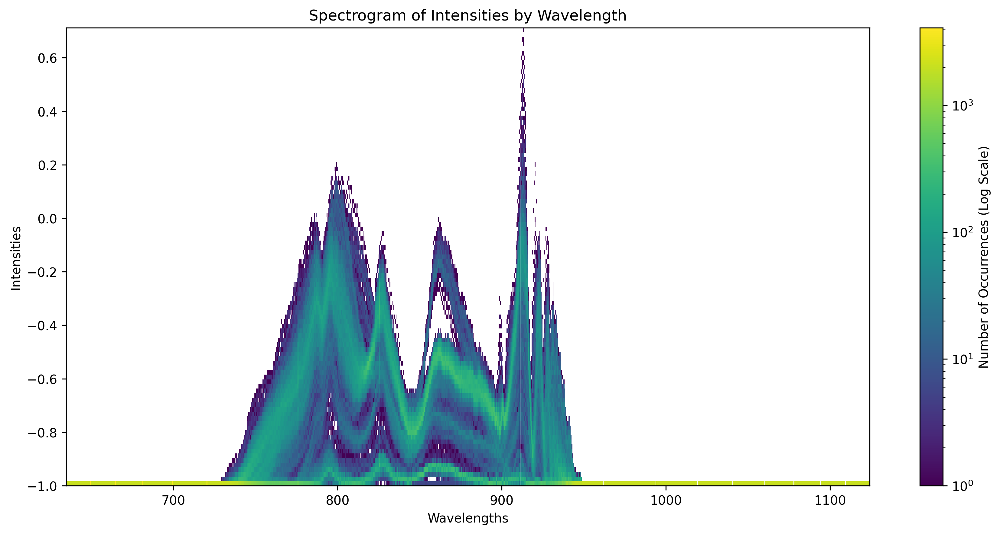

In [15]:
create_spectrogram(wavelengths, x_real, label="Spectrogram of Intensities by Wavelength")

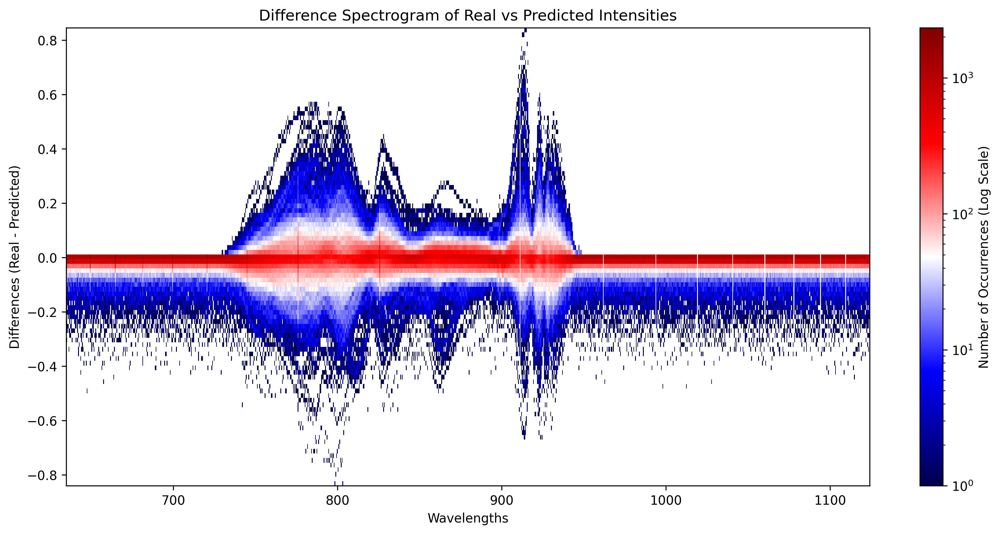

In [16]:
create_difference_spectrogram(wavelengths, 
                              x_real, 
                              predictions, 
                              label="Difference Spectrogram of Real vs Predicted Intensities")

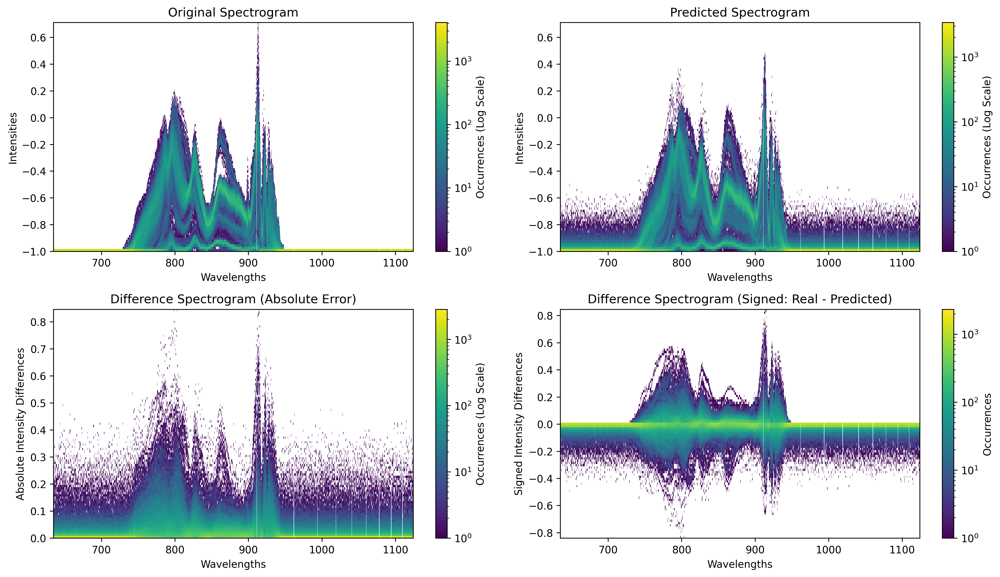

In [17]:
create_combined_spectrogram(wavelengths, 
                            x_real, 
                            predictions)

## Influence of parameters to predictions

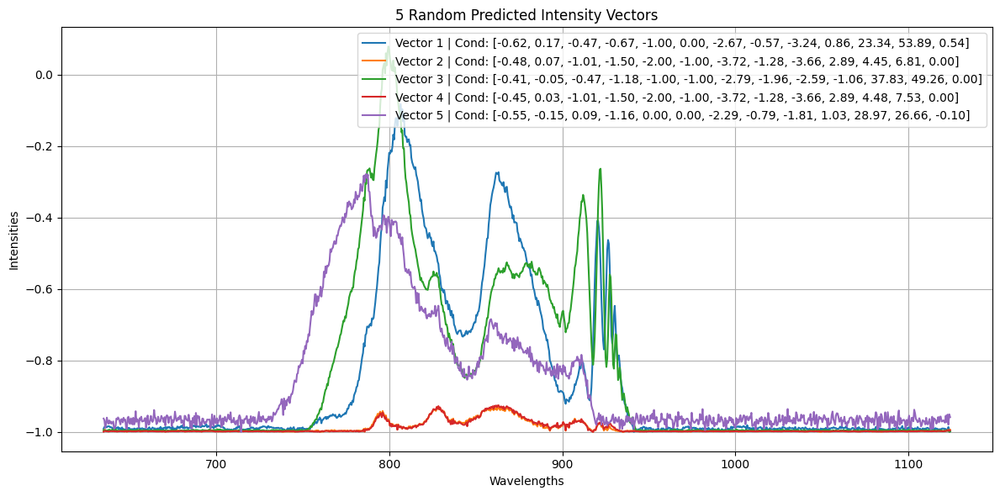

In [18]:
plot_random_intensity_vectors(wavelengths, predictions, cond_vectors)

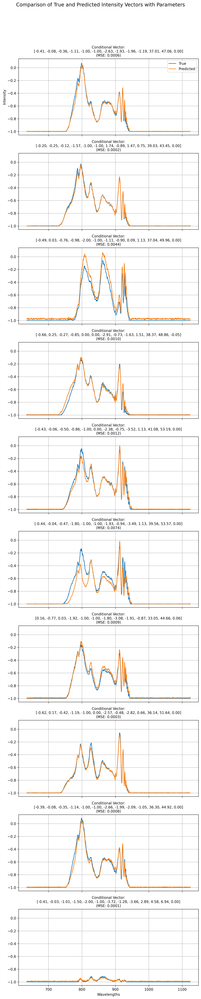

In [19]:
indices = np.random.choice(len(x_real), size=10, replace=False)

selected_real, selected_predicted, selected_conditions = plot_combined_intensity_vectors_with_parameters(
    wavelengths, x_real, predictions, cond_vectors, indices, num_vectors=10
)

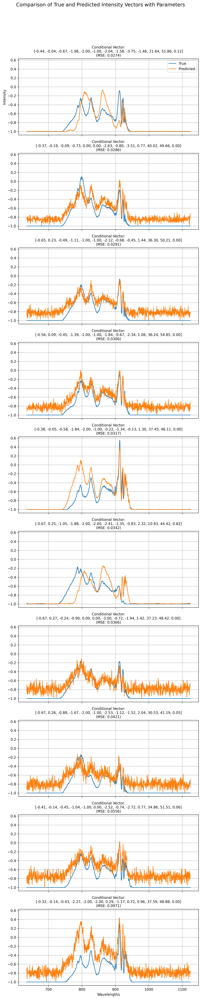

In [20]:
worst_indices = get_worst_mse_indices(x_real, predictions, n=10)
selected_real, selected_predicted, selected_conditions = plot_combined_intensity_vectors_with_parameters(
    wavelengths, x_real, predictions, cond_vectors, worst_indices, num_vectors=10
)

MSE Statistics:
Mean: 0.0024
Median: 0.0010
Standard Deviation: 0.0047
Min: 0.0000
Max: 0.0971
Range: 0.0971
Median (Q2): 0.0010
First Quartile (Q1): 0.0004
Third Quartile (Q3): 0.0025
Interquartile Range (IQR): 0.0021
Upper Whisker: 0.0057
Number of Outliers: 202.0000
Outliers: [0.00866508427842111, 0.023675035372314045, 0.020136775570089773, 0.022095763185731733, 0.021322079418349155, 0.021132730760435574, 0.0223907499154671, 0.02108898514671491, 0.022739601609128628, 0.023464453915964925]...


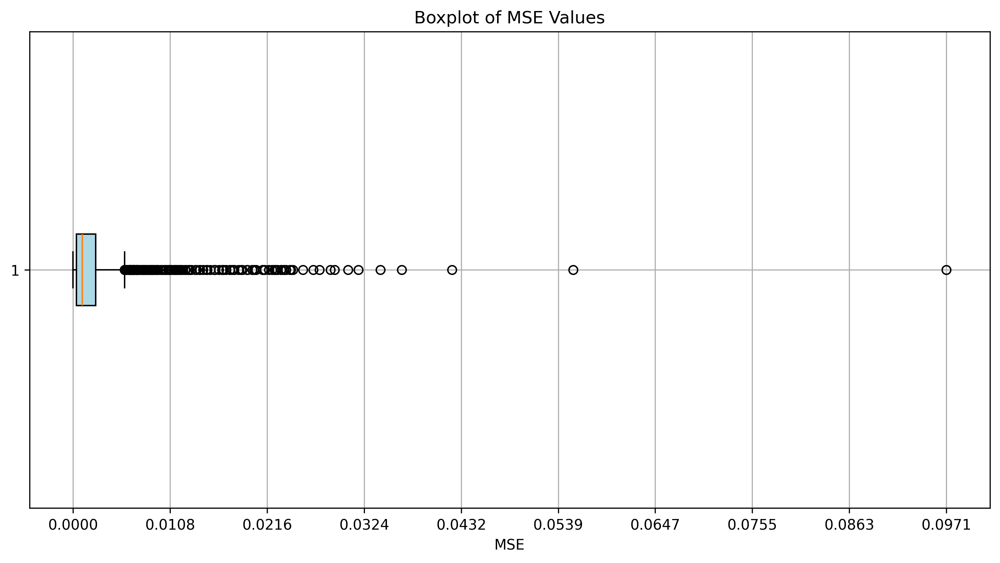

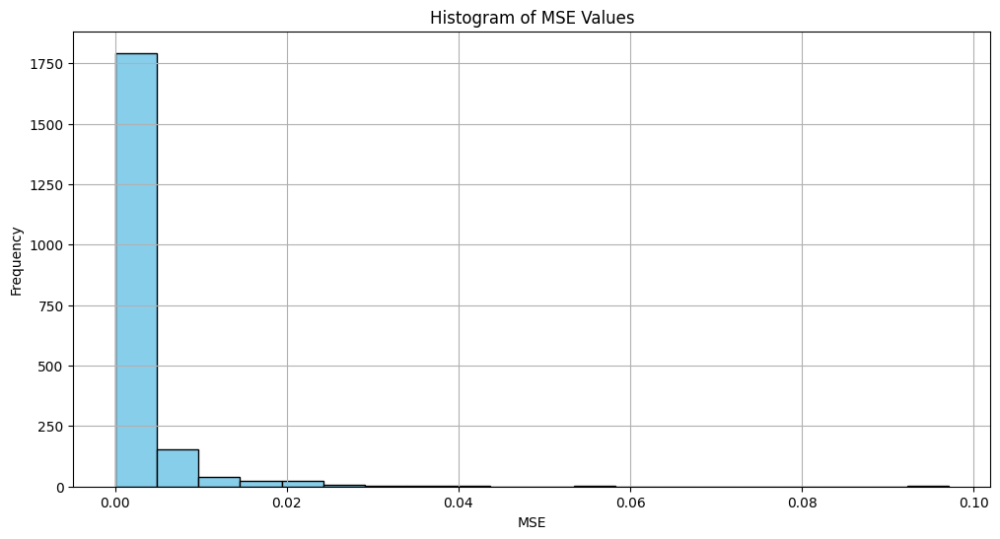

In [21]:
mse_stats = mse_statistics(x_real, predictions)

## Try Random conditional vectors

In [23]:
x_real_nonsense, cond_vectors_nonsense, predictions_nonsense = evaluate(device=device_name,
                                             test_csv_path="../data/data_nonsense.csv",
                                             model_path=model_path,
                                             scale_predictor_path=scale_predictor_path,
                                             n_samples=1,
                                             s_type='ddim',
                                             cfg_scale=cfg_scale,
                                             noise_steps=noise_steps,
                                            section_counts=section_counts)

Testing loop: 100%|█████████████████████████████████████████| 17/17 [00:27<00:00,  1.61s/it]


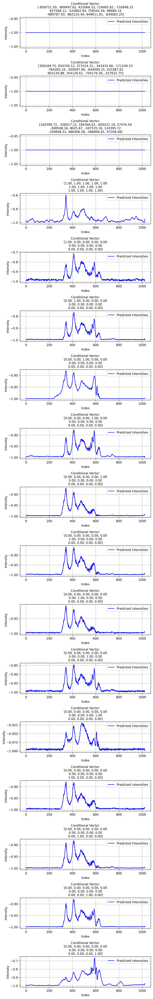

In [24]:
plot_predictions_with_cond_vectors(predictions_nonsense, cond_vectors_nonsense, num_rows=17)

## Compare distributions

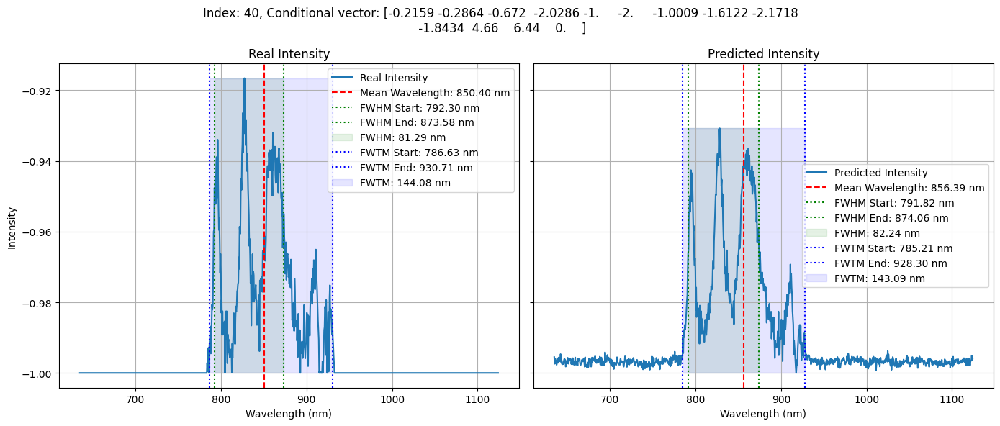

In [25]:
plot_comparison(index=40, wavelengths=wavelengths, x_real=x_real, predictions=predictions, cond_vectors=cond_vectors)

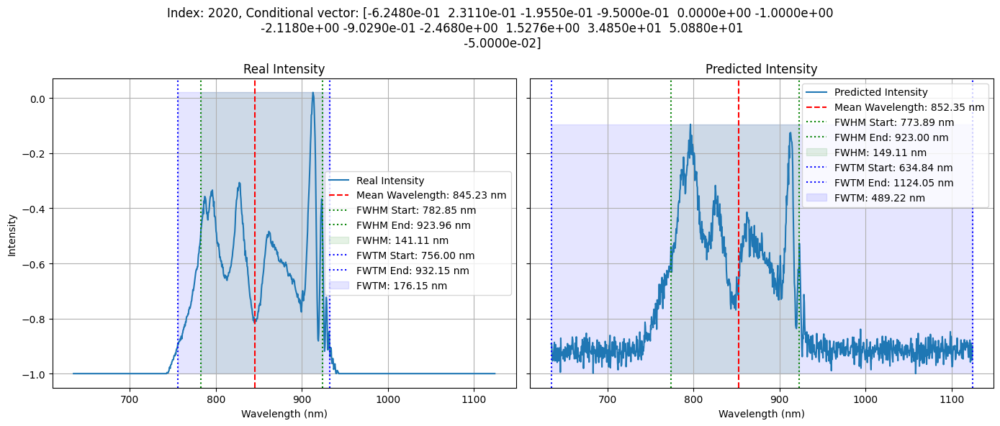

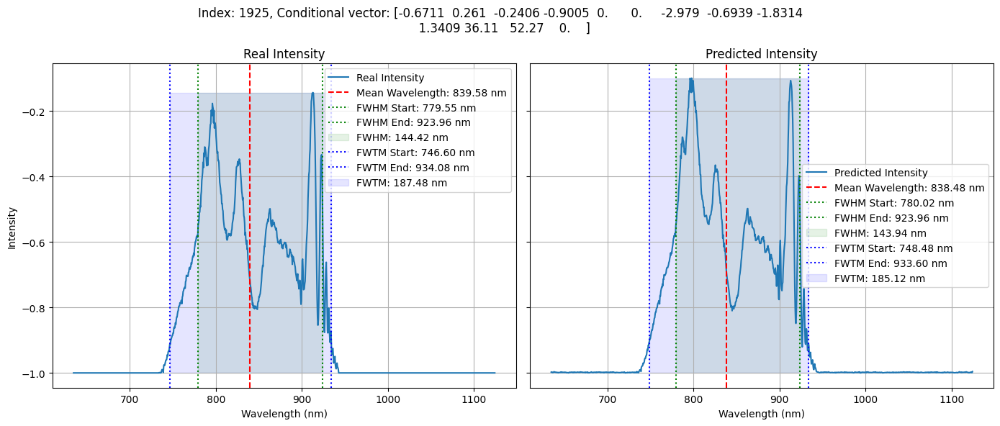

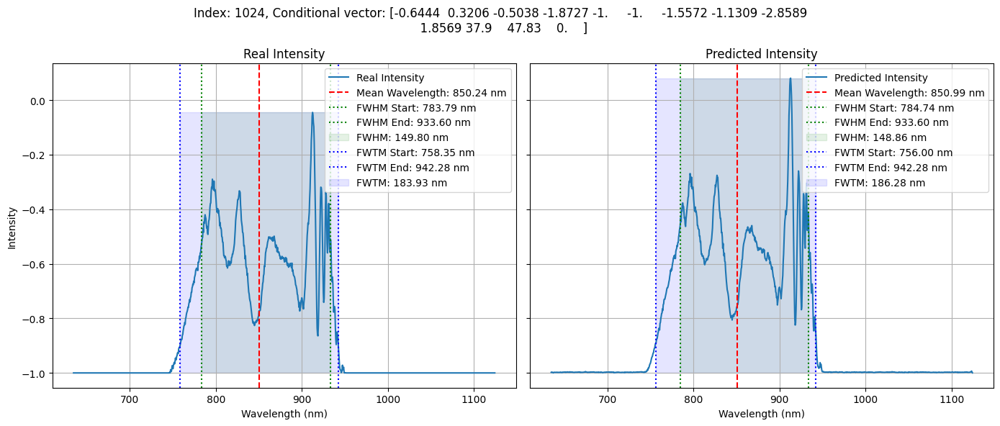

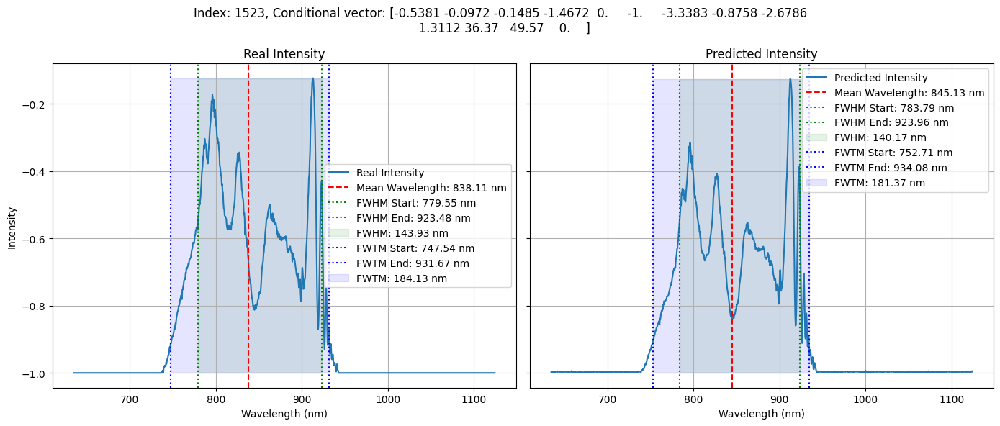

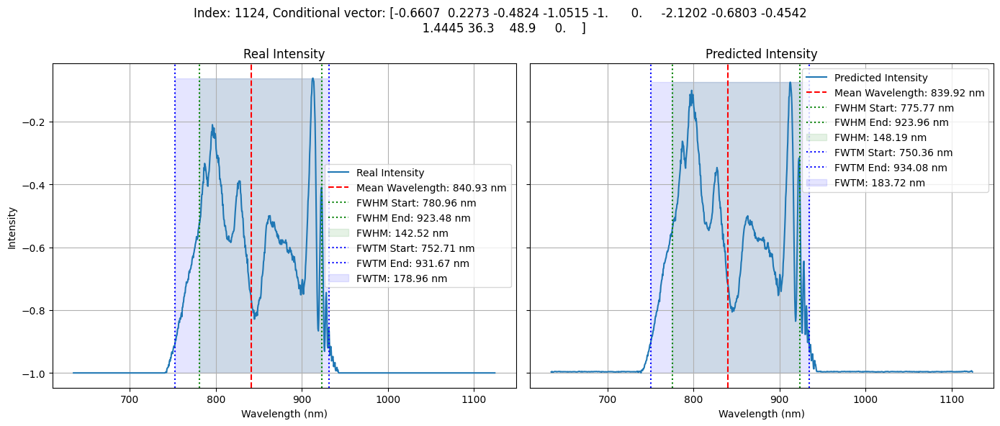

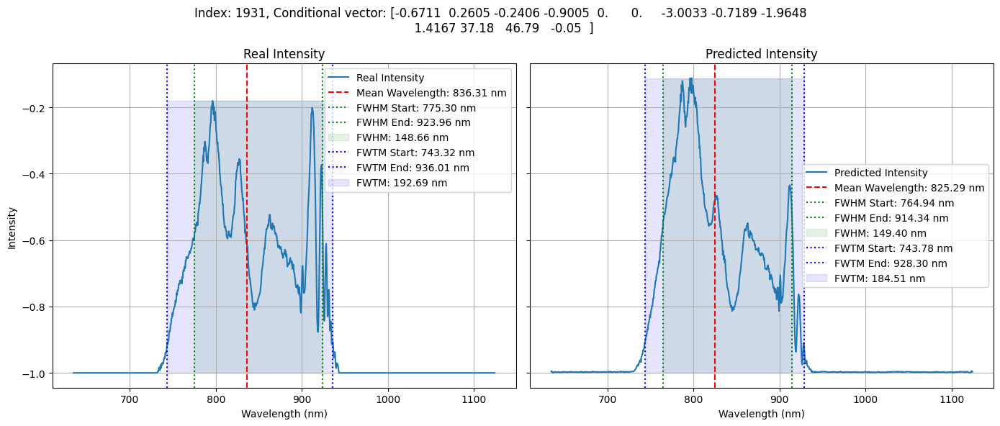

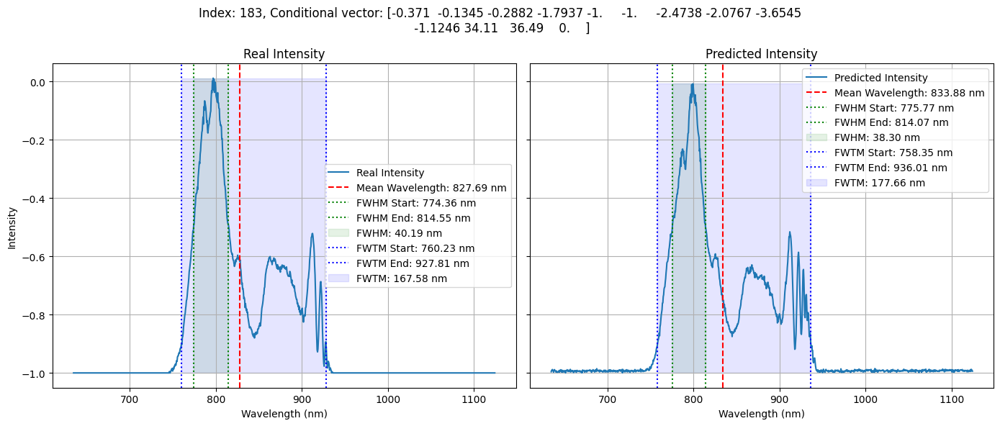

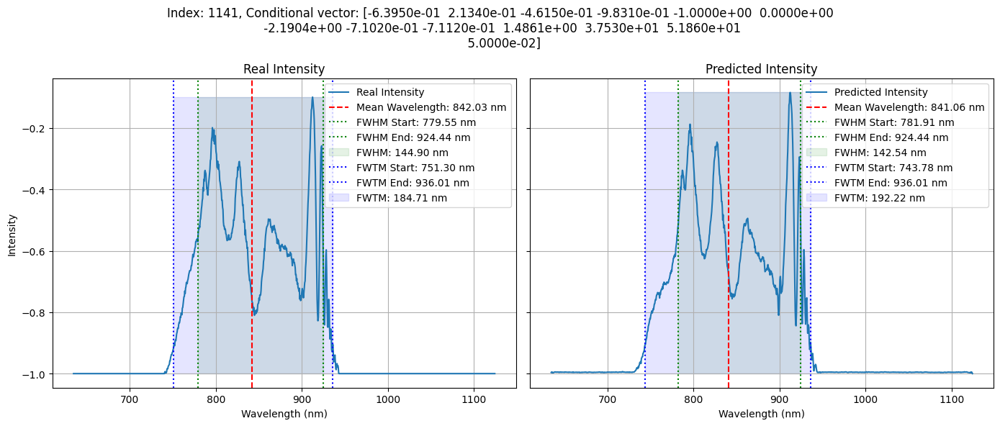

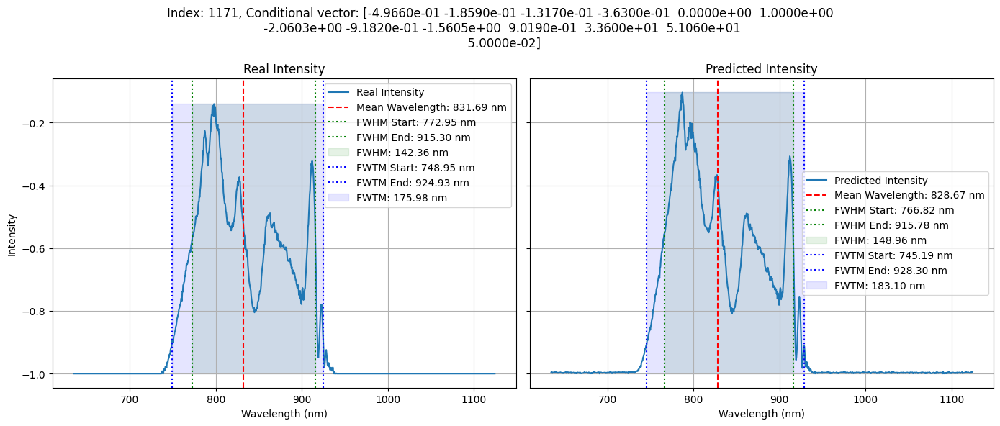

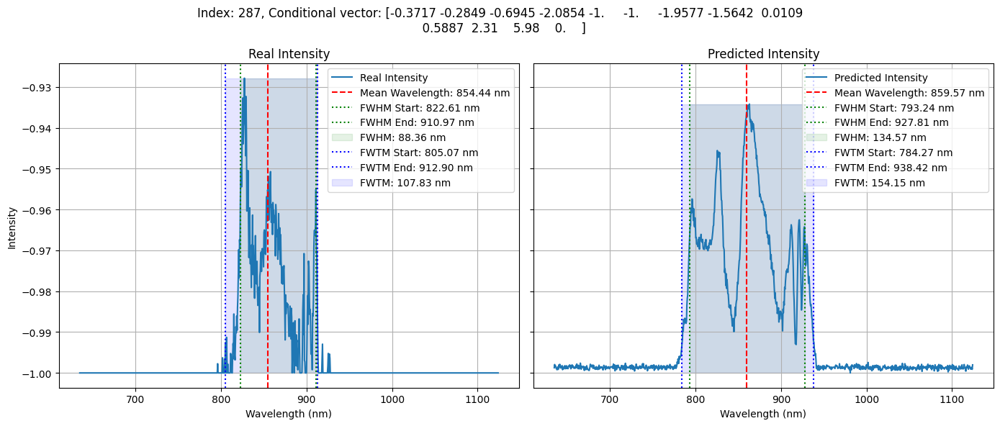

In [26]:
rand_ind = random.randint(len(x_real), size=(10))
for i in rand_ind:
    plot_comparison(index=i, wavelengths=wavelengths, x_real=x_real, predictions=predictions, cond_vectors=cond_vectors)

In [27]:
# Calculate MSE and MAE for the metrics
mse_results, mae_results = calculate_metrics_errors(wavelengths, x_real, predictions)

+-----------------+-----------+----------+
| Metric          |       MSE |      MAE |
+=================+===========+==========+
| mean_wavelength |   108.651 |  7.43091 |
+-----------------+-----------+----------+
| std_deviation   |  1028.07  | 20.904   |
+-----------------+-----------+----------+
| fwhm            |  3370.24  | 20.7222  |
+-----------------+-----------+----------+
| fwhm_start      |   753.618 |  9.64426 |
+-----------------+-----------+----------+
| fwhm_end        |  1450.06  | 14.8197  |
+-----------------+-----------+----------+
| fwtm            | 15489.7   | 52.4964  |
+-----------------+-----------+----------+
| fwtm_start      |  2735.58  | 22.8046  |
+-----------------+-----------+----------+
| fwtm_end        |  5430.62  | 31.4172  |
+-----------------+-----------+----------+


### DTW

In [29]:
dtw_distances = calculate_dtw_distances(x_real, predictions)
mean_dtw = np.mean(dtw_distances)
print(f"Mean DTW Distance: {mean_dtw:.6f}")

Mean DTW Distance: 12.257712


In [35]:
min_values = np.min(dtw_distances, axis=0)  
max_values = np.max(dtw_distances, axis=0)  
mean_values = np.mean(dtw_distances, axis=0)  
median_values = np.median(dtw_distances, axis=0)  

print("Min:", min_values)
print("Max:", max_values)
print("Mean:", mean_values)
print("Median:", median_values)

Min: 1.8225349500000108
Max: 128.20152717070044
Mean: 12.257711561474604
Median: 9.615121185999909


DTW Distance for index 721: 2.528700


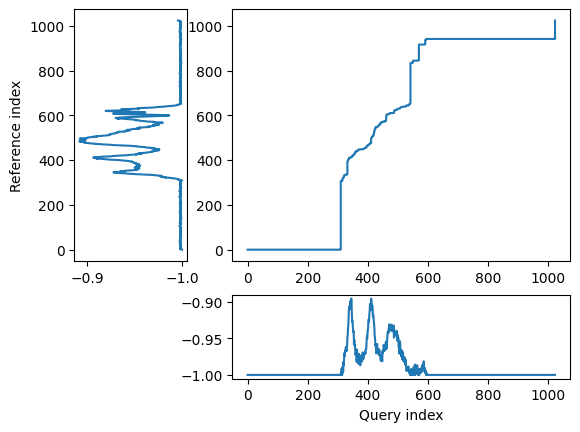

In [30]:
plot_dtw_alignment_for_index(x_real, predictions, 721)

DTW Distance for index 721: 2.528700


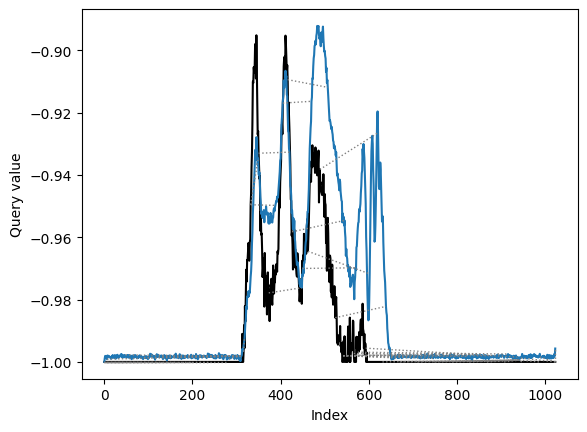

In [31]:
plot_dtw_alignment_for_index(x_real, predictions, 721, plot_type="twoway")

DTW Distance for index 1251: 22.657778


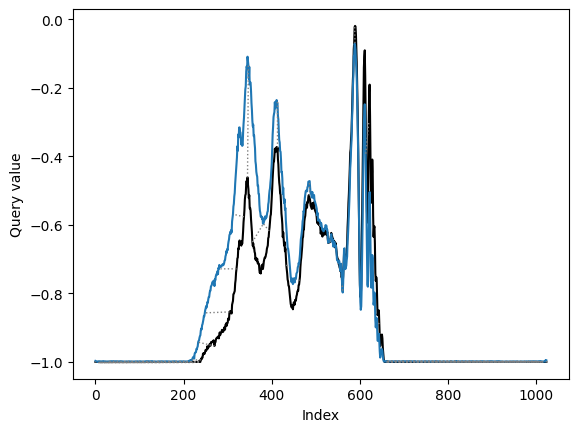

In [32]:
plot_dtw_alignment_for_index(x_real, predictions, 1251, plot_type="twoway")

### Wasserstein

In [33]:
wasserstein_distances, avg_distance = calculate_wasserstein_distance(x_real, predictions)
print(f"Average Wasserstein Distance: {avg_distance}")

Average Wasserstein Distance: 0.011954339126868703


In [34]:
min_values = np.min(wasserstein_distances, axis=0)  
max_values = np.max(wasserstein_distances, axis=0)  
mean_values = np.mean(wasserstein_distances, axis=0)  
median_values = np.median(wasserstein_distances, axis=0)  

print("Min:", min_values)
print("Max:", max_values)
print("Mean:", mean_values)
print("Median:", median_values)

Min: 0.005219951662591692
Max: 0.019737666501070904
Mean: 0.011954339126868703
Median: 0.012254022114914425
